In this project, a credit card fraud detection system has been developed to identify fraudulent transactions using anonymized financial data. Logistic regression, XGBoost, and random forest algorithms have been applied to build and compare predictive models.

The dataset has been scaled and anonymized to protect user privacy, but key insights have still been extracted through thorough exploratory data analysis. Feature importance has been evaluated, class imbalance has been addressed using under-sampling techniques, and model performance has been assessed through precision, recall, and AUC metrics. The project will be continuously refining based on ongoing research, model tuning, and evaluation of emerging techniques in fraud analytics.



# 1. Importing necessary Libraries

I will be using some of the visualization libraries like matplotlib, plotly for data exploration. I am planning to use Random Forest, Logistic Regression and XGBoost to find the model which gives higher accuracy for fraud detection.

In [ ]:
#Importing Libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

# 2. Importing Data and performing initial analysis


In [ ]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/creditcard_2023.csv


In [ ]:
data = pd.read_csv("../input/creditcard_2023.csv")

In [ ]:
data.head()

,id,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-0.260648,-0.469648,2.496266,-0.083724,0.129681,0.732898,0.519014,-0.130006,0.727159,...,-0.110552,0.217606,-0.134794,0.165959,0.126280,-0.434824,-0.081230,-0.151045,17982.10,0
1,1,0.985100,-0.356045,0.558056,-0.429654,0.277140,0.428605,0.406466,-0.133118,0.347452,...,-0.194936,-0.605761,0.079469,-0.577395,0.190090,0.296503,-0.248052,-0.064512,6531.37,0
2,2,-0.260272,-0.949385,1.728538,-0.457986,0.074062,1.419481,0.743511,-0.095576,-0.261297,...,-0.005020,0.702906,0.945045,-1.154666,-0.605564,-0.312895,-0.300258,-0.244718,2513.54,0
3,3,-0.152152,-0.508959,1.746840,-1.090178,0.249486,1.143312,0.518269,-0.065130,-0.205698,...,-0.146927,-0.038212,-0.214048,-1.893131,1.003963,-0.515950,-0.165316,0.048424,5384.44,0
4,4,-0.206820,-0.165280,1.527053,-0.448293,0.106125,0.530549,0.658849,-0.212660,1.049921,...,-0.106984,0.729727,-0.161666,0.312561,-0.414116,1.071126,0.023712,0.419117,14278.97,0


In [ ]:
data.shape


(568630, 31)

We can observe that the data is very large and hence it is possible to get good accuracy by training some models like RF, LR, XGB.

Now let's check for the null values.

In [ ]:
data.isnull().sum()

id        0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

# 3. Data Visualization and Exploration

Let's check for the number of fraud vs not fraud transaction in the column Class by using Histogram.

In [ ]:
#Checking Credit card fraud Class
px.histogram(data_frame = data, x='Class', color='Class')

/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<function matplotlib.pyplot.show(close=None, block=None)>

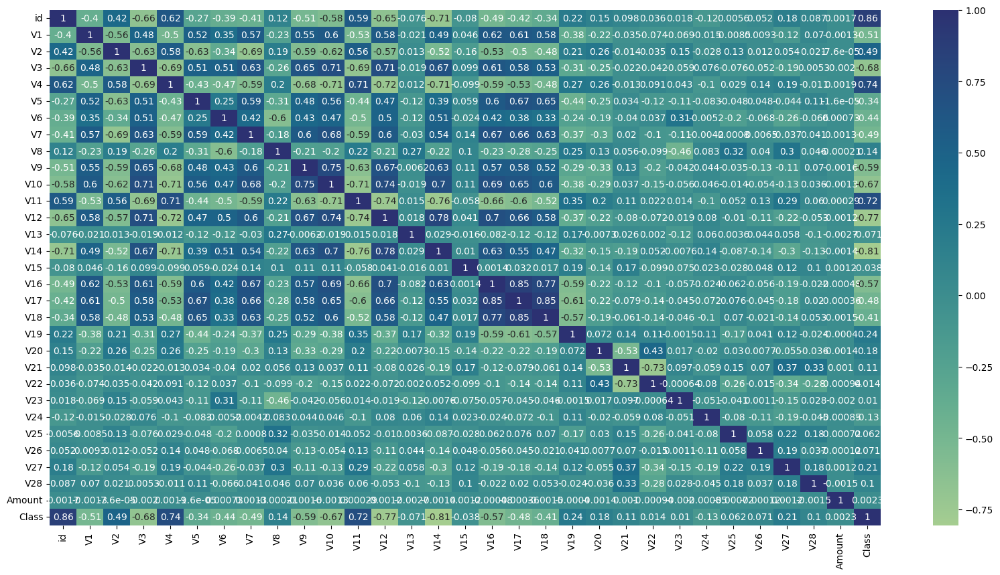

In [ ]:
plt.figure(figsize = (20,10))
sns.heatmap(data.corr(), cmap = 'crest', annot = True)
plt.show

Some of features are highly correlated among themselves. For example, V18 and V17 are highly correlated and so are V16 and V17.

Let's check the skewness of our features:

In [ ]:
data.skew()

id       -6.579536e-16
V1       -8.341717e-02
V2       -1.397952e+00
V3        1.462221e-02
V4       -4.416893e-02
V5        1.506414e+00
V6       -2.016110e-01
V7        1.902687e+01
V8        2.999722e-01
V9        1.710575e-01
V10       7.404136e-01
V11      -2.089056e-02
V12       6.675895e-02
V13       1.490639e-02
V14       2.078348e-01
V15       1.123298e-02
V16       2.664070e-01
V17       3.730610e-01
V18       1.291911e-01
V19      -1.017123e-02
V20      -1.556460e+00
V21      -1.089833e-01
V22       3.185295e-01
V23      -9.968746e-02
V24       6.608974e-02
V25       2.300804e-02
V26      -1.895874e-02
V27       2.755452e+00
V28       1.724978e+00
Amount    1.655585e-03
Class     0.000000e+00
dtype: float64

**Positively Skewed Data:**

Features like V7, V5, V20, V27, and V28 exhibit positive skewness. This is indicated by their positive mean values, with V7 being particularly notable with a mean of approximately 19.03.
Positive skewness suggests that the majority of data points in these features are concentrated on the lower end, with a long tail extending towards higher values.

**Negatively Skewed Data:**

None of the features in the provided data exhibit significant negative skewness. Negative skewness would be indicated by negative mean values, but all features have means closer to zero or slightly positive.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



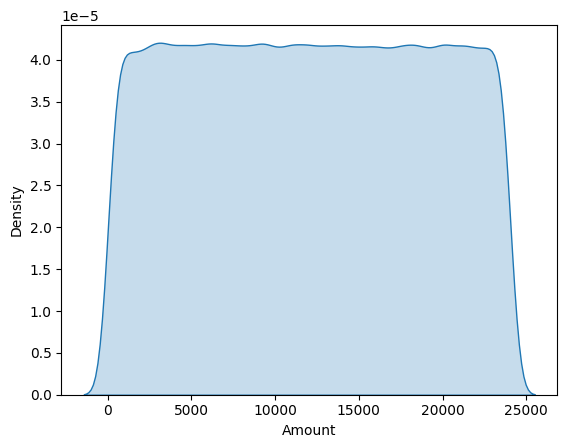

In [ ]:
#visualize the distribution of the 'Amount' variable in the dataset using a KDE plot.
sns.kdeplot(data = data['Amount'], fill=True)
plt.show()

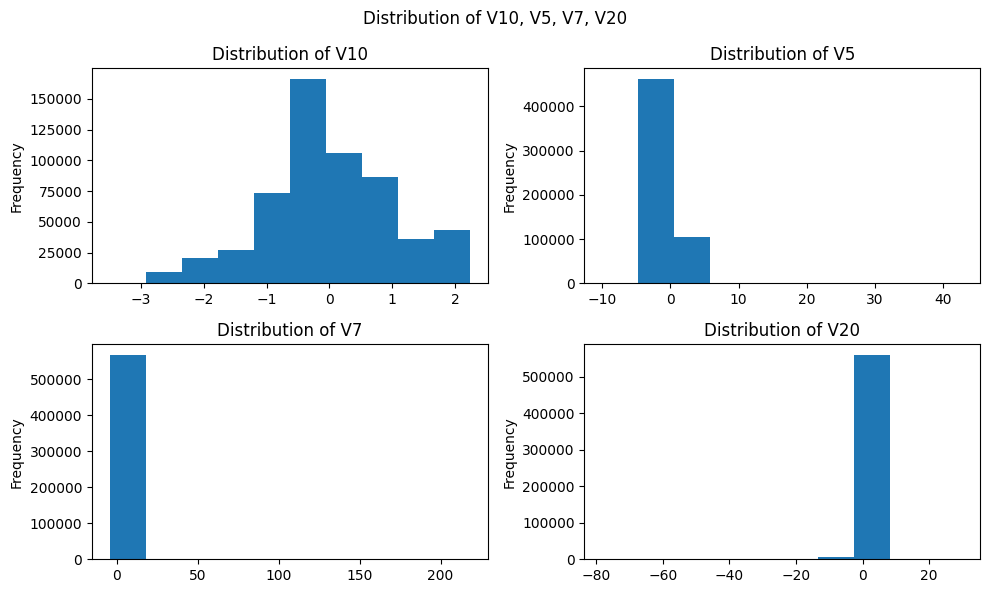

In [ ]:
paper, axes = plt.subplots(2, 2, figsize=(10,6))
data['V1'].plot(kind='hist', ax = axes[0,0], title = 'Distribution of V10')
data['V5'].plot(kind='hist', ax = axes[0,1], title = 'Distribution of V5')
data['V7'].plot(kind='hist', ax = axes[1,0], title = 'Distribution of V7')
data['V20'].plot(kind='hist', ax = axes[1,1], title = 'Distribution of V20')
plt.suptitle('Distribution of V10, V5, V7, V20')
plt.tight_layout()

In summary, the data exhibits positively skewed features, with some features displaying more pronounced skewness compared to others. There's no evidence of negatively skewed data, and certain features appear to have symmetric distributions.

# 4. Model Implementation

We will define our dependent and independent features by 'y' and 'X'.


In [ ]:
y = data.Class
X = data.drop(['id', 'Class'], axis=1)

In [ ]:
X.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,-0.260648,-0.469648,2.496266,-0.083724,0.129681,0.732898,0.519014,-0.130006,0.727159,0.637735,...,0.091202,-0.110552,0.217606,-0.134794,0.165959,0.126280,-0.434824,-0.081230,-0.151045,17982.10
1,0.985100,-0.356045,0.558056,-0.429654,0.277140,0.428605,0.406466,-0.133118,0.347452,0.529808,...,-0.233984,-0.194936,-0.605761,0.079469,-0.577395,0.190090,0.296503,-0.248052,-0.064512,6531.37
2,-0.260272,-0.949385,1.728538,-0.457986,0.074062,1.419481,0.743511,-0.095576,-0.261297,0.690708,...,0.361652,-0.005020,0.702906,0.945045,-1.154666,-0.605564,-0.312895,-0.300258,-0.244718,2513.54
3,-0.152152,-0.508959,1.746840,-1.090178,0.249486,1.143312,0.518269,-0.065130,-0.205698,0.575231,...,-0.378223,-0.146927,-0.038212,-0.214048,-1.893131,1.003963,-0.515950,-0.165316,0.048424,5384.44
4,-0.206820,-0.165280,1.527053,-0.448293,0.106125,0.530549,0.658849,-0.212660,1.049921,0.968046,...,0.247237,-0.106984,0.729727,-0.161666,0.312561,-0.414116,1.071126,0.023712,0.419117,14278.97


In [ ]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Class, dtype: int64

In [ ]:
print(X.shape)
print(y.shape)

(568630, 29)
(568630,)


In [ ]:
from sklearn.preprocessing import StandardScaler

X_scaled = StandardScaler().fit_transform(X)

In [ ]:
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)
X_scaled_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,-0.260648,-0.469648,2.496266,-0.083724,0.129681,0.732898,0.519014,-0.130006,0.727159,0.637735,...,0.091202,-0.110552,0.217606,-0.134794,0.165959,0.126280,-0.434824,-0.081230,-0.151045,0.858447
1,0.985100,-0.356045,0.558056,-0.429654,0.277140,0.428605,0.406466,-0.133118,0.347452,0.529808,...,-0.233984,-0.194936,-0.605761,0.079469,-0.577395,0.190090,0.296503,-0.248052,-0.064512,-0.796369
2,-0.260272,-0.949385,1.728538,-0.457986,0.074062,1.419481,0.743511,-0.095576,-0.261297,0.690708,...,0.361652,-0.005020,0.702906,0.945045,-1.154666,-0.605564,-0.312895,-0.300258,-0.244718,-1.377011
3,-0.152152,-0.508959,1.746840,-1.090178,0.249486,1.143312,0.518269,-0.065130,-0.205698,0.575231,...,-0.378223,-0.146927,-0.038212,-0.214048,-1.893131,1.003963,-0.515950,-0.165316,0.048424,-0.962119
4,-0.206820,-0.165280,1.527053,-0.448293,0.106125,0.530549,0.658849,-0.212660,1.049921,0.968046,...,0.247237,-0.106984,0.729727,-0.161666,0.312561,-0.414116,1.071126,0.023712,0.419117,0.323285


Now, let's import all the necessary models and metrics from scikit-learn.

In [ ]:
import gc
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from catboost import CatBoostClassifier
from sklearn import svm
import lightgbm as lgb
from lightgbm import LGBMClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [ ]:
#Splitting the dataset into training and testing.
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, y, test_size = 0.2, random_state = 5, stratify = y)

## 1. Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()

In [ ]:
LR.fit(X_train, y_train)

LogisticRegression()

In [ ]:
lr_predictions_train = LR.predict(X_train)
lr_predictions_test = LR.predict(X_test)

Accuracy Score is: 0.9647705889594288
              precision    recall  f1-score   support

           0       0.95      0.98      0.97    227452
           1       0.98      0.95      0.96    227452

    accuracy                           0.96    454904
   macro avg       0.97      0.96      0.96    454904
weighted avg       0.97      0.96      0.96    454904



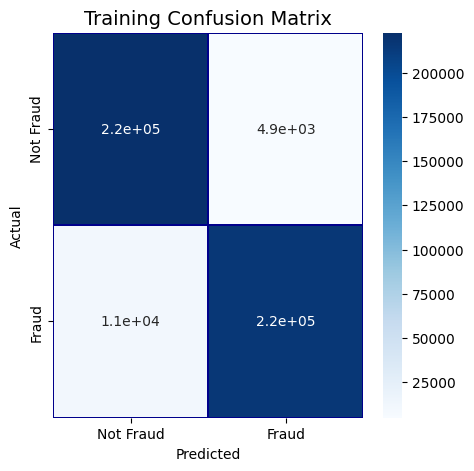

In [ ]:
asc = accuracy_score(y_train, lr_predictions_train)
cr = classification_report(y_train, lr_predictions_train)
print("Accuracy Score is:", asc)
print(cr)
cm = pd.crosstab(y_train, lr_predictions_train, rownames=['Actual'], colnames=['Predicted'])
fig, (ax1) = plt.subplots(ncols=1, figsize=(5,5))
sns.heatmap(cm,
            xticklabels=['Not Fraud', 'Fraud'],
            yticklabels=['Not Fraud', 'Fraud'],
            annot=True,ax=ax1,
            linewidths=.2,linecolor="Darkblue", cmap="Blues")
plt.title('Training Confusion Matrix', fontsize=14)
plt.show()

Accuracy Score is: 0.9656630849585847
[[55708  1155]
 [ 2750 54113]]
              precision    recall  f1-score   support

           0       0.95      0.98      0.97     56863
           1       0.98      0.95      0.97     56863

    accuracy                           0.97    113726
   macro avg       0.97      0.97      0.97    113726
weighted avg       0.97      0.97      0.97    113726



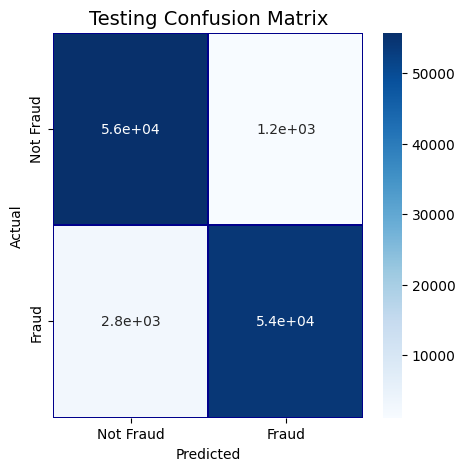

In [ ]:
asc = accuracy_score(y_test, lr_predictions_test)
cm = confusion_matrix(y_test, lr_predictions_test)
cr = classification_report(y_test, lr_predictions_test)
print("Accuracy Score is:", asc)
print(cm)
print(cr)

cm = pd.crosstab(y_test, lr_predictions_test, rownames=['Actual'], colnames=['Predicted'])
fig, (ax1) = plt.subplots(ncols=1, figsize=(5,5))
sns.heatmap(cm,
            xticklabels=['Not Fraud', 'Fraud'],
            yticklabels=['Not Fraud', 'Fraud'],
            annot=True,ax=ax1,
            linewidths=.2,linecolor="Darkblue", cmap="Blues")
plt.title('Testing Confusion Matrix', fontsize=14)
plt.show()

So, after running our logistic regression model, it yielded a high accuracy of 97%.

Reviewing the confusion matrix, we notice generally accurate classifications with a few errors scattered in. Precision and recall metrics for both normal and fraudulent transactions are commendably high, resulting in an overall F1-score of 97%.

## 2. Random Forest


In [ ]:
RFC = RandomForestClassifier(n_jobs = 4,
                             random_state = 5,
                             n_estimators = 100,
                             max_depth = 5,
                             verbose = False)

In [ ]:
#Training the Random Forest Classifier model using the training data.
RFC.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, n_jobs=4, random_state=5, verbose=False)

In [ ]:
rf_predictions_train = RFC.predict(X_train)
rf_predictions_test = RFC.predict(X_test)

Accuracy Score is: 0.9544277473928565
              precision    recall  f1-score   support

           0       0.95      0.98      0.97    227452
           1       0.98      0.95      0.96    227452

    accuracy                           0.96    454904
   macro avg       0.97      0.96      0.96    454904
weighted avg       0.97      0.96      0.96    454904



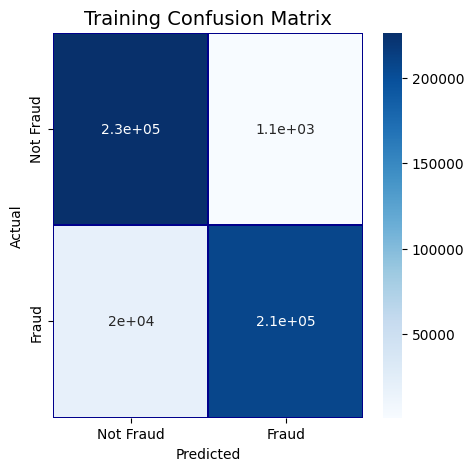

In [ ]:
asc = accuracy_score(y_train, rf_predictions_train)
cr = classification_report(y_train, lr_predictions_train)
print("Accuracy Score is:", asc)
print(cr)

# Plot training confusion matrix
cm = pd.crosstab(y_train, rf_predictions_train, rownames=['Actual'], colnames=['Predicted'])
fig, (ax1) = plt.subplots(ncols=1, figsize=(5,5))
sns.heatmap(cm,
            xticklabels=['Not Fraud', 'Fraud'],
            yticklabels=['Not Fraud', 'Fraud'],
            annot=True,ax=ax1,
            linewidths=.2,linecolor="Darkblue", cmap="Blues")
plt.title('Training Confusion Matrix', fontsize=14)
plt.show()

Accuracy Score is: 0.9551026150572428
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     56863
           1       1.00      0.91      0.95     56863

    accuracy                           0.96    113726
   macro avg       0.96      0.96      0.96    113726
weighted avg       0.96      0.96      0.96    113726



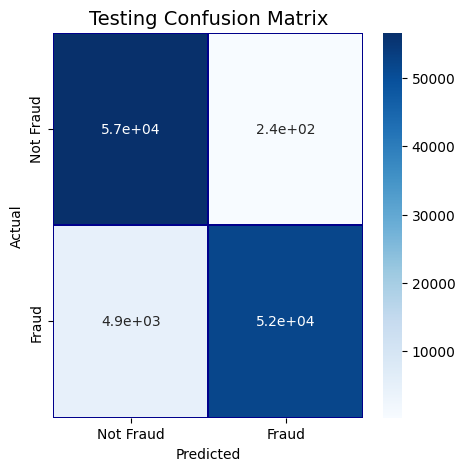

In [ ]:
asc = accuracy_score(y_test, rf_predictions_test)
cr = classification_report(y_test, rf_predictions_test)
print("Accuracy Score is:", asc)
print(cr)

# Plot testing confusion matrix
cm = pd.crosstab(y_test, rf_predictions_test, rownames=['Actual'], colnames=['Predicted'])
fig, (ax1) = plt.subplots(ncols=1, figsize=(5,5))
sns.heatmap(cm,
            xticklabels=['Not Fraud', 'Fraud'],
            yticklabels=['Not Fraud', 'Fraud'],
            annot=True,ax=ax1,
            linewidths=.2,linecolor="Darkblue", cmap="Blues")
plt.title('Testing Confusion Matrix', fontsize=14)
plt.show()


The accuracy score obtained from **Random Forest Classfier** is **0.96**.

## 3. XGBoost

In [ ]:
# Prepare the train and test datasets
dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

#Here the focus is on monitoring training and testing.
watchlist = [(dtrain, 'train'), (dtest, 'test')]

# Set xgboost parameters
params = {}
params['objective'] = 'binary:logistic'
params['eta'] = 0.039
params['silent'] = True
params['max_depth'] = 2
params['subsample'] = 0.8
params['colsample_bytree'] = 0.9
params['eval_metric'] = 'auc'
params['random_state'] = 5

In [ ]:
model = xgb.train(params,
                dtrain,
                1000,
                watchlist,
                early_stopping_rounds=50,
                maximize=True,
                verbose_eval=50)

/opt/conda/lib/python3.10/site-packages/xgboost/core.py:727: FutureWarning:

Pass `evals` as keyword args.

/opt/conda/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[19:51:03] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "silent" } are not used.




[0]	train-auc:0.95851	test-auc:0.95963
[50]	train-auc:0.98641	test-auc:0.98657
[100]	train-auc:0.99083	test-auc:0.99095
[150]	train-auc:0.99358	test-auc:0.99368
[200]	train-auc:0.99506	test-auc:0.99514
[250]	train-auc:0.99613	test-auc:0.99617
[300]	train-auc:0.99687	test-auc:0.99689
[350]	train-auc:0.99740	test-auc:0.99742
[400]	train-auc:0.99784	test-auc:0.99785
[450]	train-auc:0.99818	test-auc:0.99818
[500]	train-auc:0.99843	test-auc:0.99844
[550]	train-auc:0.99866	test-auc:0.99867
[600]	train-auc:0.99887	test-auc:0.99887
[650]	train-auc:0.99901	test-auc:0.99902
[700]	train-auc:0.99914	test-auc:0.99916
[750]	train-auc:0.99925	test-auc:0.99926
[800]	train-auc:0.99933	test-auc:0.99933
[850]	train-auc:0.99940	test-auc:0.99941
[900]	train-auc:0.99947	test-auc:0.99947
[950]	train-auc:0.99953	test-auc:0.99953
[999]	train-auc:0.99957	test-auc:0.99958


In [ ]:
xgb_preds = model.predict(dtest)

Accuracy Score is: 0.9871885057066986
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     56863
           1       1.00      0.98      0.99     56863

    accuracy                           0.99    113726
   macro avg       0.99      0.99      0.99    113726
weighted avg       0.99      0.99      0.99    113726

Confusion Matrix:
[[56624   239]
 [ 1218 55645]]


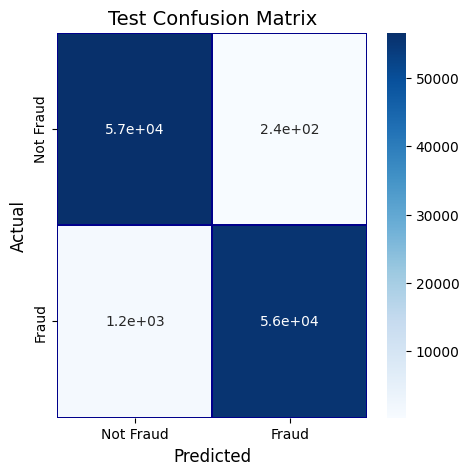

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Convert probabilities to binary predictions
threshold = 0.6  # The threshold can be adjusted if needed
binary_preds = np.where(xgb_preds > threshold, 1, 0)

# Calculate accuracy
asc = accuracy_score(y_test, binary_preds)
print("Accuracy Score is:", asc)

# Generate classification report
cr = classification_report(y_test, binary_preds)
print(cr)

# Compute confusion matrix
cm = confusion_matrix(y_test, binary_preds)
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
plt.figure(figsize=(5,5))
sns.heatmap(cm,
            xticklabels=['Not Fraud', 'Fraud'],
            yticklabels=['Not Fraud', 'Fraud'],
            annot=True,
            linewidths=.2,
            linecolor="Darkblue",
            cmap="Blues")
plt.title('Test Confusion Matrix', fontsize=14)
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('Actual', fontsize=12)
plt.show()


We have obtained the highest accuracy score for XGBoost which is 0.99!

# Conclusion

Out of all three models which we have used for this particular dataset, we observe that XGBoost give the highest accuracy.

Logistic Regression achieved an impressive accuracy of 97%, with generally accurate classifications observed in the confusion matrix.
Random Forest Classifier yielded an accuracy score of 96%, demonstrating robust performance in fraud detection.
XGBoost emerged as the most effective model with the highest accuracy score of 99%.


XGBoost proved to be the most effective model for fraud detection in this dataset, outperforming logistic regression and Random Forest.


The project demonstrates the potential of machine learning algorithms in detecting credit card fraud.
Further enhancements could involve refining the models, exploring additional algorithms, and optimizing hyperparameters to improve accuracy and efficiency.

